In [1]:
import numpy as np
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
# from fitburst.analysis.model import SpectrumModeler

from astropy.constants import c
import astropy.units as u
from astropy.time import Time
import chime_frb_constants as constants

import baseband
from baseband import vdif
from baseband_tasks.shaping import Transpose, Reshape
from baseband_tasks.functions import Square, Power

ImportError: cannot import name 'update_default_config' from 'astropy.config.configuration' (/home/abernier/.local/lib/python3.11/site-packages/astropy/config/configuration.py)

In [66]:
# !module list

In [67]:
# !pip list

In [68]:
# Constants
SAMPLE_RATE = constants.FPGA_COUNTS_PER_SECOND * u.Hz
FCENS = np.linspace(775, 425, 8) # * u.MHz

S_LABELS = ['I', 'Q', 'U', 'V']

# Open Files

If X and Y are the two complex voltages (2 pols), then we have

$$ I = \left<∣X∣^2 + ∣Y∣^2\right>  $$

$$ Q = \left< |X|^2 - |Y|^2 \right> $$

$$ U = \left< 2 \, \mathrm{Re}(X Y^*) \right> $$

$$ V = \left< 2 \, \mathrm{Im}(X Y^*) \right> $$

In [5]:
def get_freq(fcen):
    """
    Get frequency band array using the center frequency (in MHz).
    """
    
    # unit = fcen.unit
    fcen = fcen.value
    return np.linspace(fcen-25, fcen+25, 128)
    

def downsample_data(fh, data, time_global, Nsamples_per_chunk=391):
    """
    Downsample data along the time axis. 

    Parameters
    ----------
    fh : 
    data : np.ndarray
        data array matching what is read from fh.
    time_global : List
        List of times since starting to read all files. Gets extended with current file times.
    Nsamples_per_chunk : int
        Number of samples the average over. Last chunk will have equal or less than this number.
    """

    # Get time info (in seconds)
    Ntimes = fh.shape[0]
    dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
    t_file = np.linspace(0, dt_total, Ntimes)  # relative times within file

    # Start indices for every ~1ms chunk in this file
    start_edges = list(range(0, Ntimes, Nsamples_per_chunk))

    # Time of 1ms chunks relative to start of time_global array
    t_data = [t_file[e] + elapsed_time for e in start_edges]
    time_global.extend(t_data)

    # Average data along time axis
    data_avg = np.array([np.mean(data[e:e+Nsamples_per_chunk], axis=0) for e in start_edges])

    return data_avg


def get_stokes(data):
    """
    Get Stokes I, Q, U, V from powers and cross terms of two polarizations.

    Parameters
    ----------
    data : np.ndarray
        Data array with shape (Ntimes, Nfreqs, Nterms). The Nterms contains the powers
        and cross terms for two polarizations. Axis is ordered as ['XX', 'YY', 'XY', 'YX'].
    """
    
    I = data[:,:,0] + data[:,:,1]  # |X|^2 + |Y|^2
    Q = data[:,:,0] - data[:,:,1]  # |X|^2 - |Y|^2
    U = 2 * data[:,:,2]  # 2 Re(XY*)
    V = 2 * data[:,:,3]  # 2 Im(XY*)

    return I, Q, U, V
    

def add_data_single(file, data_dict, time_global, elapsed_time, transpose_shape):
    """
    Load and append data from a single VDIF file. Input lists contained in data_dict are modified in place.

    Parameters
    ----------
    file : str
        Absolute path to the VDIF file. The data inside must have shape 
        (Ntimes, Nchannels * Npols, Nsubbands).
    data_dict : dict with lists of np.ndarray
        Dict containing lists of data arrays to which the loaded data will be appended 
        for each stokes parameters.
    time_global : list
        List of time values to which the time samples will be appended.
        This list corresponds to the existing data_array time axis. 
    elapsed_time : float
        Time elapsed since start of time_global array.
    transpose_shape : tuple of int
        Order of axis indices to use for transposing the loaded data when reshaping 
        to merge frequency axes. The time axis is exluded.

    Returns
    -------
    elapsed_time : float
        Updated total elapsed time after this file.
    
    """

    # Open file
    fh = vdif.open(file, 'rs', sample_rate=SAMPLE_RATE)

    # Reshape the data
    fh = Reshape(fh, (16,2,8))  # splitting frequency and polarization
    fh = Transpose(fh, transpose_shape)  # swapping axes so sub-bands and frequency channels are together
    fh = Reshape(fh, (128,2))  # combining sub-bands and frequency channels

    # Convert pol data to power & cross terms
    fh = Power(fh, polarization=['XX', 'YY', 'XY', 'YX'])  # Shape (Ntimes, Nfreqs, 4)
    
    # Read data
    data = fh.read()  # Shape (Ntimes, Nfreqs, Nterms)
    
    # Downsample to ~1ms (avg every 391 samples)
    data_avg = downsample_data(fh, data, time_global)

    # Get all Stokes parameters
    I, Q, U, V = get_stokes(data_avg)
    
    # Append to the corresponding lists in data_dict
    data_dict['I'].append(I)
    data_dict['Q'].append(Q)
    data_dict['U'].append(U)
    data_dict['V'].append(V)

    # Update time axis
    dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
    return elapsed_time + dt_total

In [6]:
# Pick a frequency band
freq_band = 5
freq = get_freq(FCENS[freq_band])

# File info
source_dir = '/home/i/istairs/abernier/scratch/pulsar_data/2022_CHIME_B2111+46'
file_list = sorted(glob.glob(f'{source_dir}/{freq_band}/20220826T064420Z_CHIME_vdif/*_0{freq_band}.vdif'))

# Initialize arrays
t_global = []  # [seconds]
data_dict = {'I': [], 'Q': [], 'U': [], 'V': []}

# Info for function
start_file = 160  # skip first ~20s
Nfiles_time = 100  # (~10s)
elapsed_time = 0.0  # [seconds]
transpose_shape = (1,3,2)  # for (Nchannels, Nsubbands, Npols)

# Get time averaged data
for i,f in enumerate(file_list[start_file:Nfiles]):
    elapsed_time = add_data_single(file=f,
                                    data_dict=data_dict, 
                                    time_global=t_global, 
                                    elapsed_time=elapsed_time, 
                                    transpose_shape=transpose_shape
                                   )
    if i==Nfiles//4: print('25% done...')
    if i==Nfiles//2: print('50% done...')
    if i==(Nfiles//4 + Nfiles//2): print('75% done...')

25% done...
50% done...
75% done...


In [ ]:
def get_freq_array(freq_bands):

    freq_bands = np.sorted(freq_bands)
    Nfreqs = int(1024/8 * len(freq_bands))
    
    fstart = FCENS[freq_bands[-1]] - 25
    fstop = FCENS[freq_bands[0]] + 25
    
    return np.linspace(fstart, fstop, Nfreqs)


def get_stokes(data):
    """
    Get Stokes I, Q, U, V from powers and cross terms of two polarizations.

    Parameters
    ----------
    data : np.ndarray
        Data array with shape (Ntimes, Nfreqs, Nterms). The Nterms contains the powers
        and cross terms for two polarizations. Axis is ordered as ['XX', 'YY', 'XY', 'YX'].
    """
    
    I = data[:,:,0] + data[:,:,1]  # |X|^2 + |Y|^2
    Q = data[:,:,0] - data[:,:,1]  # |X|^2 - |Y|^2
    U = 2 * data[:,:,2]  # 2 Re(XY*)
    V = 2 * data[:,:,3]  # 2 Im(XY*)

    return I, Q, U, V


def downsample_data(fh, data, time_global, Nsamples_per_chunk=391):
    """
    Downsample data along the time axis. 

    Parameters
    ----------
    fh : 
    data : np.ndarray
        data array matching what is read from fh.
    time_global : List
        List of times since starting to read all files. Gets extended with current file times.
    Nsamples_per_chunk : int
        Number of samples the average over. Last chunk will have equal or less than this number.
    """
    
    # Get time info (in seconds)
    Ntimes = fh.shape[0]
    # Start indices for every ~1ms chunk in this file
    start_edges = list(range(0, Ntimes, Nsamples_per_chunk))
    if i==0:
        dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
        t_file = np.linspace(0, dt_total, Ntimes)  # relative times within file

        # Time of 1ms chunks relative to start of time_global array
        t_data = [t_file[e] + elapsed_time for e in start_edges]
        time.extend(t_data)

        # Update time axis
        dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
        elapsed_time = elapsed_time + dt_total

    # Average data along time axis
    data_avg = np.array([np.mean(data[e:e+Nsamples_per_chunk], axis=0) for e in start_edges])
    return data_avg


def read_file(file, data_list, time, elapsed_time, band_index, transpose_shape=(1,3,2)):
    """
    Load and append data from a single VDIF file. Input lists contained in data_dict are modified in place.

    Parameters
    ----------
    file : str
        Absolute path to the VDIF file. The data inside must have shape 
        (Ntimes, Nchannels * Npols, Nsubbands).
    data_list : list of np.ndarray
        List of data arrays to which the loaded data will be appended 
        for each stokes parameters. Shape [Nstokes, Ntimes, Nfreqs]
    time= : list
        List of time values to which the time samples will be appended.
        This list corresponds to the existing data_array time axis. 
    elapsed_time : float
        Time elapsed since start of the time array.
    band_index : int
        Index of frequency band currently being processed.
    transpose_shape : tuple of int
        Order of axis indices to use for transposing the loaded data when reshaping 
        to merge frequency axes. The time axis is exluded.

    Returns
    -------
    elapsed_time : float
        Updated total elapsed time after this file.
    
    """

    # Open file
        fh = vdif.open(file, 'rs', sample_rate=SAMPLE_RATE)
    
        # Reshape the data
        fh = Reshape(fh, (16,2,8))  # splitting frequency and polarization
        fh = Transpose(fh, transpose_shape)  # swapping axes so sub-bands and frequency channels are together
        fh = Reshape(fh, (128,2))  # combining sub-bands and frequency channels
    
        # Convert pol data to power & cross terms
        fh = Power(fh, polarization=['XX', 'YY', 'XY', 'YX'])  # Shape (Ntimes, Nfreqs, Nterms=4)
        
        # Read data
        data = fh.read()  # Shape (Ntimes, Nfreqs, Nterms)

        
        # Downsample to ~1ms (avg every 391 samples)
        # data_avg = downsample_data(fh, data, time_global)
        # Get time info (in seconds)
        Ntimes = fh.shape[0]
        # Start indices for every ~1ms chunk in this file
        start_edges = list(range(0, Ntimes, Nsamples_per_chunk))
        if i==0:
            dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
            t_file = np.linspace(0, dt_total, Ntimes)  # relative times within file
    
            # Time of 1ms chunks relative to start of time_global array
            t_data = [t_file[e] + elapsed_time for e in start_edges]
            time.extend(t_data)
    
            # Update time axis
            dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
            elapsed_time = elapsed_time + dt_total
    
        # Average data along time axis
        data_avg = np.array([np.mean(data[e:e+Nsamples_per_chunk], axis=0) for e in start_edges])

    
        # Get all Stokes parameters
        I, Q, U, V = get_stokes(data_avg)
        # Add to list of data for this band
        stokes_stack = np.array([I, Q, U, V])  # Shape: (Nstokes=4, Ntimes, Nfreqs)
        data_list.append(stokes_stack)
    

# def get_data(source_dir, freq_bands, start_file_ind=0, Nfiles=100)
#     """
#     """


#     return full_data, time, freq

In [107]:
####################
source_dir = '/home/i/istairs/abernier/scratch/pulsar_data/2022_CHIME_B2111+46'
freq_bands = [4,5,6]
start_file_ind = 160
Nfiles = 2




Nsamples_per_chunk=391

# Arrays to return
time = []  # [seconds]
freq = get_freq_array(freq_bands)  # [MHz]
full_data = []

elapsed_time = 0.0  # [seconds]
transpose_shape = (1,3,2)  # for (Nchannels, Nsubbands, Npols)

for i,fband in enumerate(freq_bands):
    print(f'Processing band {fband}')
    
    file_list = sorted(glob.glob(f'{source_dir}/{fband}/20220826T064420Z_CHIME_vdif/*_0{fband}.vdif'))
    band_data = []  # Stores I,Q,U,V for this band

    for file in file_list[start_file_ind:start_file_ind+Nfiles]:
        # Open file
        fh = vdif.open(file, 'rs', sample_rate=SAMPLE_RATE)
    
        # Reshape the data
        fh = Reshape(fh, (16,2,8))  # splitting frequency and polarization
        fh = Transpose(fh, transpose_shape)  # swapping axes so sub-bands and frequency channels are together
        fh = Reshape(fh, (128,2))  # combining sub-bands and frequency channels
    
        # Convert pol data to power & cross terms
        fh = Power(fh, polarization=['XX', 'YY', 'XY', 'YX'])  # Shape (Ntimes, Nfreqs, 4)
        
        # Read data
        data = fh.read()  # Shape (Ntimes, Nfreqs, Nterms)

        
        # Downsample to ~1ms (avg every 391 samples)
        # data_avg = downsample_data(fh, data, time_global)
        # Get time info (in seconds)
        Ntimes = fh.shape[0]
        # Start indices for every ~1ms chunk in this file
        start_edges = list(range(0, Ntimes, Nsamples_per_chunk))
        if i==0:
            dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
            t_file = np.linspace(0, dt_total, Ntimes)  # relative times within file
    
            # Time of 1ms chunks relative to start of time_global array
            t_data = [t_file[e] + elapsed_time for e in start_edges]
            time.extend(t_data)
    
            # Update time axis
            dt_total = (fh.stop_time - fh.start_time).sec  # dt of file
            elapsed_time = elapsed_time + dt_total
    
        # Average data along time axis
        data_avg = np.array([np.mean(data[e:e+Nsamples_per_chunk], axis=0) for e in start_edges])

    
        # Get all Stokes parameters
        I = data_avg[:,:,0] + data_avg[:,:,1]  # |X|^2 + |Y|^2
        Q = data_avg[:,:,0] - data_avg[:,:,1]  # |X|^2 - |Y|^2
        U = 2 * data_avg[:,:,2]  # 2 Re(XY*)
        V = 2 * data_avg[:,:,3]  # 2 Im(XY*)

        
        stokes_stack = np.array([I, Q, U, V])  # Shape: (4, Ntimes, Nfreqs)
        band_data.append(stokes_stack)
        
    band_data = np.concatenate(band_data, axis=1)  3 
    band_data = np.flip(band_data, axis=2)  # flip frequency axis
    
    full_data.append(band_data)

full_data = np.concatenate(full_data[::-1], axis=2)  # flip band order

time = np.array(time)  # [s]
# time_since_file0 = time + dt_total * start_file_ind  # Update time to add unread files?


Processing band 4
(4, 256, 128)
Processing band 5
(4, 256, 128)
Processing band 6
(4, 256, 128)
(4, 256, 384)


# Plot Raw Stokes

In [9]:
# def plot_data_2d(data_array, time, freq, title='', xlim=None, ylim=None, cbar_max=None):
#     """
#     Make a 2D plot of the input data.

#     Parameters
#     ----------
#     data_array : 
#     time : 
#     freq : 
#     title : 
#     xlim : 
#     ylim : 
#     cbar_max : 
#     """
    
#     fig = plt.figure(dpi=250)

#     # Color range
#     if cbar_max is not None:
#         linear = plt.cm.colors.Normalize(vmax=cbar_max)
#     else: 
#         vmin = np.nanpercentile(data_array, 5)
#         vmax = np.nanpercentile(data_array, 95)
#         linear = plt.cm.colors.Normalize(vmin=vmin, vmax=vmax)

#     # Plot data
#     extent = [time[0],time[-1],freq[0].value,freq[-1].value]  # give as xmin,xmax,ymin,ymax
#     plt.imshow(data_array.T, aspect='auto', origin='lower', extent=extent, norm=linear)  # give data as (y,x)

#     # Labels
#     plt.xlabel('Time [s]')
#     plt.ylabel('Freq [MHz]')
#     plt.title(title)

#     # Colorbar
#     cbar = plt.colorbar()
#     cbar.set_label(label='Intensity')

#     # Axes limits
#     if xlim is not None: 
#         plt.xlim(xlim[0],xlim[1])
#     if ylim is not None: 
#         plt.ylim(ylim[0],ylim[1])
    
#     plt.show()

In [10]:
# # Plot data before normalizing & flagging
# plot_data_2d(data_array=data_dict['I'], time=t_global, freq=freq,
#              title='Unnormalized Stokes I', #xlim=[45,55], 
#             )

In [12]:
# --- 4-panels plot function ---
def plot_stokes(stokes_params, freq, time, t_unit='ms', suptitle='', 
                rfi_masked=None, height_ratios=[1, 3], cbar_lim=None):
    """
    Plot Stokes parameters I, Q, U, V in a 2x2 grid.

    Parameters
    ----------
    stokes_params : List of 4 arrays for Stokes I, Q, U, V. Each of shape [Ntimes, Nfreqs]
    freq : Frequency array (MHz).
    time : Time array (in t_unit).
    t_unit : Defines the unit for the time array (e.g., 'ms', 's').
    suptitle : Title for the entire figure.
    rfi_masked : List of RFI channels to highlight in red.
    height_ratios : Height ratio of the top/bottom panels for each Stokes subplot.
    cbar_lim : Stokes data arrays to use to set the cbar limits. When None, stokes_params is used.
    """
    
    # Figure info
    fig = plt.figure(figsize=(10, 11), dpi=200)
    outer = gridspec.GridSpec(2, 2, hspace=0.15, wspace=0.35)  # 2x2 grid for Stokes parameters
    extent = (time[0], time[-1], freq[0], freq[-1])
    subtitles = ['I', 'Q', 'U', 'V']

    for i in range(4):
        row = i // 2
        col = i % 2

        # Define inner grid for timeseries and Stokes parameter plots
        inner = gridspec.GridSpecFromSubplotSpec(
            2, 1,  # 2 rows: timeseries + stokes
            subplot_spec=outer[row, col],
            height_ratios=height_ratios,
            hspace=0.0  # no space between timeseries and stokes
        )

        # Add subplots
        timeseries_ax = fig.add_subplot(inner[0])
        stokes_ax = fig.add_subplot(inner[1], sharex=timeseries_ax)

        # --- Add timeseries plot ---
        timeseries = np.nanmean(stokes_params[i], axis=1)  # Average over frequency
        timeseries_ax.scatter(time, timeseries, color='black', s=1)
        timeseries_ax.set_title(f'Stokes {subtitles[i]}')
        timeseries_ax.tick_params(length=0, labelbottom=False, labelleft=False)

        # --- Add Stokes parameter plot ---
        if cbar_lim is None:
            cbar_lim = stokes_params
        vmin = np.nanpercentile(cbar_lim[i], 5)
        vmax = np.nanpercentile(cbar_lim[i], 95)
        linear = plt.cm.colors.Normalize(vmin=vmin, vmax=vmax)
        # Plot data
        im = stokes_ax.imshow(stokes_params[i].T, 
                       origin='lower', 
                       aspect='auto', 
                       extent=extent, 
                       cmap='viridis',
                       norm=linear
                       )
        
        # --- Colorbar ---
        anchor_height = 0.39 if row==0 else 0.
        cbar = fig.colorbar(im, ax=(timeseries_ax, stokes_ax), pad=0.05, 
                        shrink=height_ratios[1]/np.sum(height_ratios) * 1.06, 
                        anchor=(1.65, anchor_height)
                        )
        # cbar.set_label(cbar_label)
        
        # --- Highlight RFI channels ---
        if rfi_masked is not None:
            add_rfi_rectangles(stokes_ax, rfi_masked, freq=freq, time=time)

        # --- Axes labels ---
        if i >= 2:
            stokes_ax.set_xlabel(f'Time [{t_unit}]')
        if i % 2 == 0:
            stokes_ax.set_ylabel('Frequency [MHz]')

    plt.suptitle(suptitle)
    plt.subplots_adjust(top=0.93) 
    plt.show()

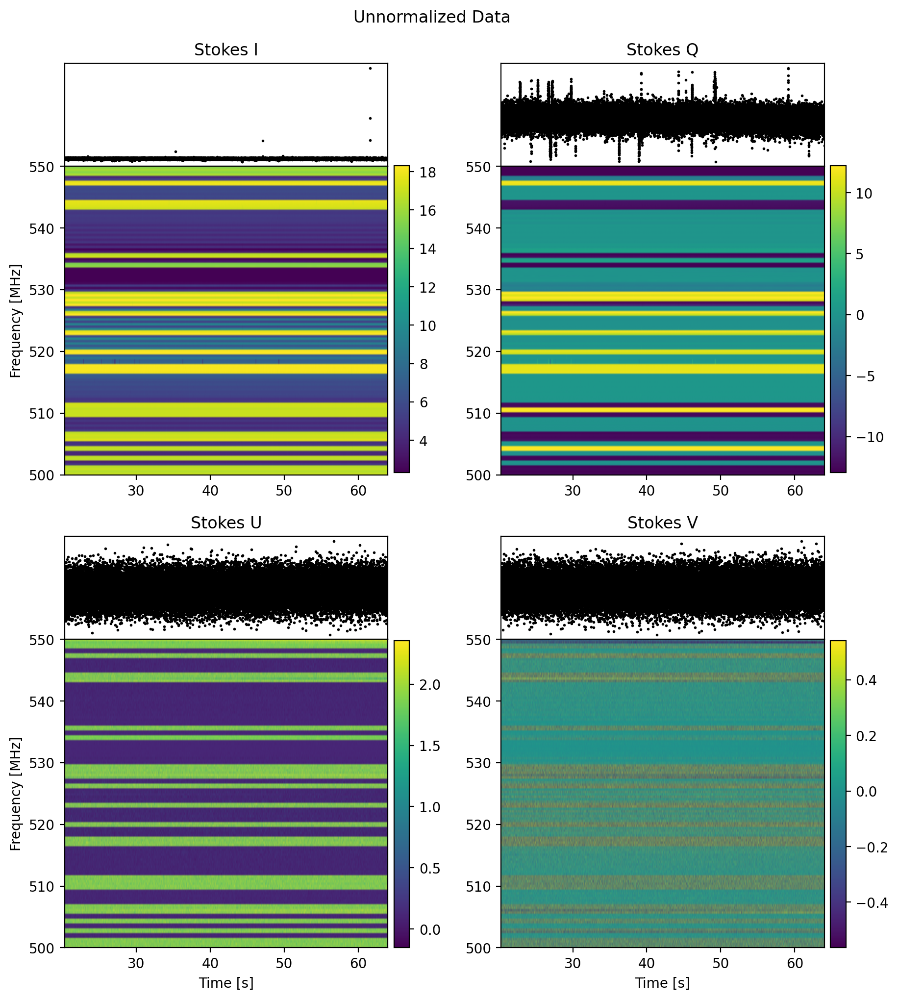

In [14]:
# Plot unnormalized data
stokes_list = [data_dict[s] for s in S_LABELS]
plot_stokes(stokes_list, freq=freq, time=t_global, t_unit='s', suptitle='Unnormalized Data')

# Mask RFI & Normalize

In [16]:
def get_rfi_mask(data_array, mean_treshhold=2, std_threshold=5):
    """
    Flag frequency channels based on statistics between channels. Returns the mask.

    Parameters
    ----------
    data_array : np.ndarray
        Normalized data array to flag for RFI (shape: [Ntimes, Nfreqs])
    mean_threshold : float
        
    std_threshold : float
    """

    # Mean and std per frequency channel (avg across time)
    mean_per_channel = np.nanmean(data_array, axis=0)
    std_per_channel = np.nanstd(data_array, axis=0)

    # Normalize & compare channel means
    means_norm = (mean_per_channel - np.mean(mean_per_channel)) / np.std(mean_per_channel)
    channel_mask_mean = np.abs(means_norm) > mean_treshhold  # mask if channel mean is #sigma away from other channel means

    # Normalize & compare channel stds
    stds_norm = (std_per_channel - np.mean(std_per_channel)) / np.std(std_per_channel)
    channel_mask_std = np.abs(stds_norm) > std_threshold  # mask if channel std is #sigma away from other channel stds
    
    # Combine masks
    channel_mask = channel_mask_mean | channel_mask_std
    
    # Mask data
    # data_masked = data_array.copy()
    # data_masked[:,channel_mask] = np.nan

    return channel_mask

In [14]:
# def flag_rfi_??():
    # """
    # Flag RFI using stuff from paper
    # """

IndentationError: unexpected indent (2466100181.py, line 2)

In [17]:
def normalize_data(data_array):
    """
    Compute statistics by frequency channel and normalize the input data.

    Parameters
    ----------
    data_array : np.ndarray
        Single array of data to normalize (shape: [Ntimes, Nfreqs]).
    """
    
    mean_per_channel = np.nanmean(data_array, axis=0)  # avg in time
    std_per_channel = np.nanstd(data_array, axis=0)
    data_normalized = (data_array - mean_per_channel[None,:]) / std_per_channel[None,:]

    return data_normalized

In [18]:
# Get RFI mask using intensity data
rfi_mask = get_rfi_mask(data_dict['I'], mean_treshhold=2, std_threshold=1.3)


# Normalize & mask all stokes
data_norm_dict = {}
data_norm_masked_dict = {}

for s in S_LABELS:
    data_norm_dict[s] = normalize_data(data_dict[s])
    data_norm_masked = data_norm_dict[s].copy()
    data_norm_masked[:,rfi_mask] = np.nan
    data_norm_masked_dict[s] = data_norm_masked

In [21]:
def plot_rfi_masking(data_array, data_masked, time, freq, suptitle=''):
    """
    """

    # Create figure
    fig, axes = plt.subplots(
        1, 3,
        figsize=(15, 6),
        dpi=200,
        sharey=True,
        gridspec_kw={'wspace': 0, 'width_ratios': [1, 1, 0.4]},
    )

    # Colorbar & axes limits
    vmin = np.nanpercentile(data_array, 5)
    vmax = np.nanpercentile(data_array, 95)
    linear = plt.cm.colors.Normalize(vmin=vmin, vmax=vmax)
    extent = [time[0], time[-1], freq[0], freq[-1]]
    
    # Plot panel 1
    im0 = axes[0].imshow(data_array.T, aspect='auto', origin='lower', extent=extent, norm=linear, cmap='viridis')
    axes[0].set_title('Unmasked')
    axes[0].set_ylabel('Frequency [MHz]')
    axes[0].set_xlabel('Time [s]')
    
    # Plot panel 2
    im1 = axes[1].imshow(data_masked.T, aspect='auto', origin='lower', extent=extent, norm=linear, cmap='viridis')
    axes[1].set_title('Masked')
    axes[1].set_xlabel('Time [s]')
    
    # Add a single colorbar for both axes
    cbar = fig.colorbar(im0, ax=axes, orientation='vertical', fraction=0.025, pad=0.02)
    # cbar.set_label(label='Intensity')

    # Get std per channel (excluding flagged channels)
    std_per_channel = np.nanstd(data_array, axis=0)
    stds_norm = (std_per_channel - np.mean(std_per_channel)) / np.std(std_per_channel)
    
    # Plot panel 3
    im2 = axes[2].plot(stds_norm, freq, c='k', lw=1)
    axes[2].set_xlabel('Std')

    fig.suptitle(suptitle)
    plt.show()

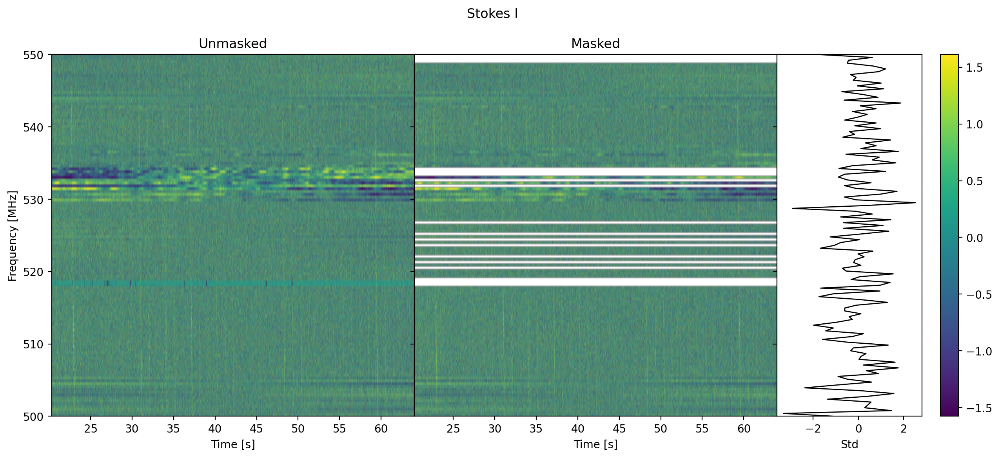

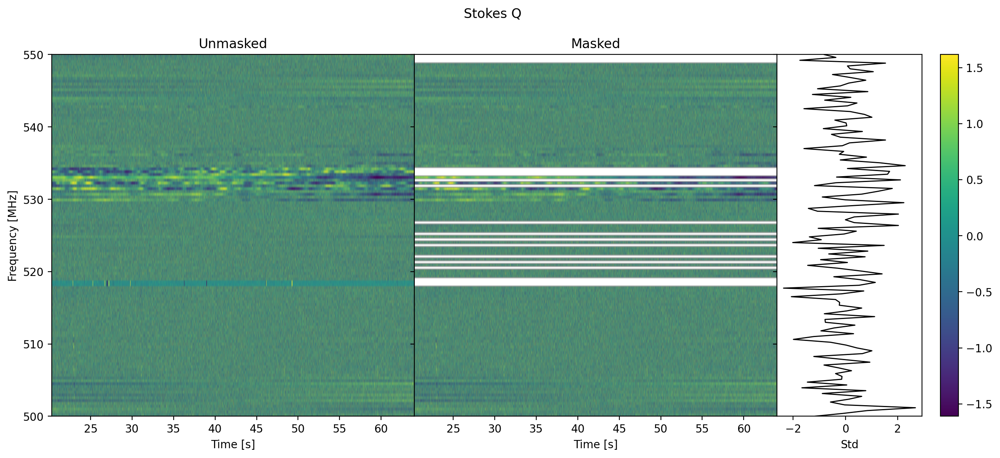

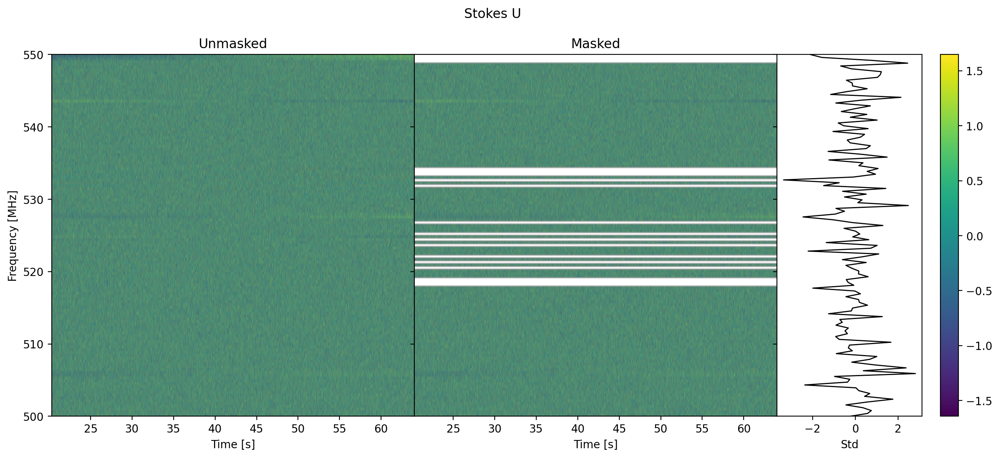

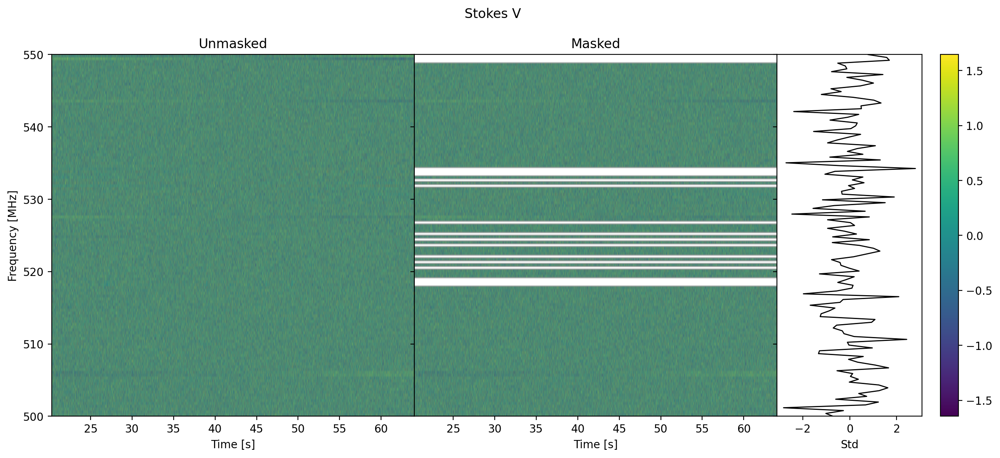

In [22]:
for s in S_LABELS:
    plot_rfi_masking(data_norm_dict[s], data_norm_masked_dict[s], t_global, freq, suptitle=f'Stokes {s}')

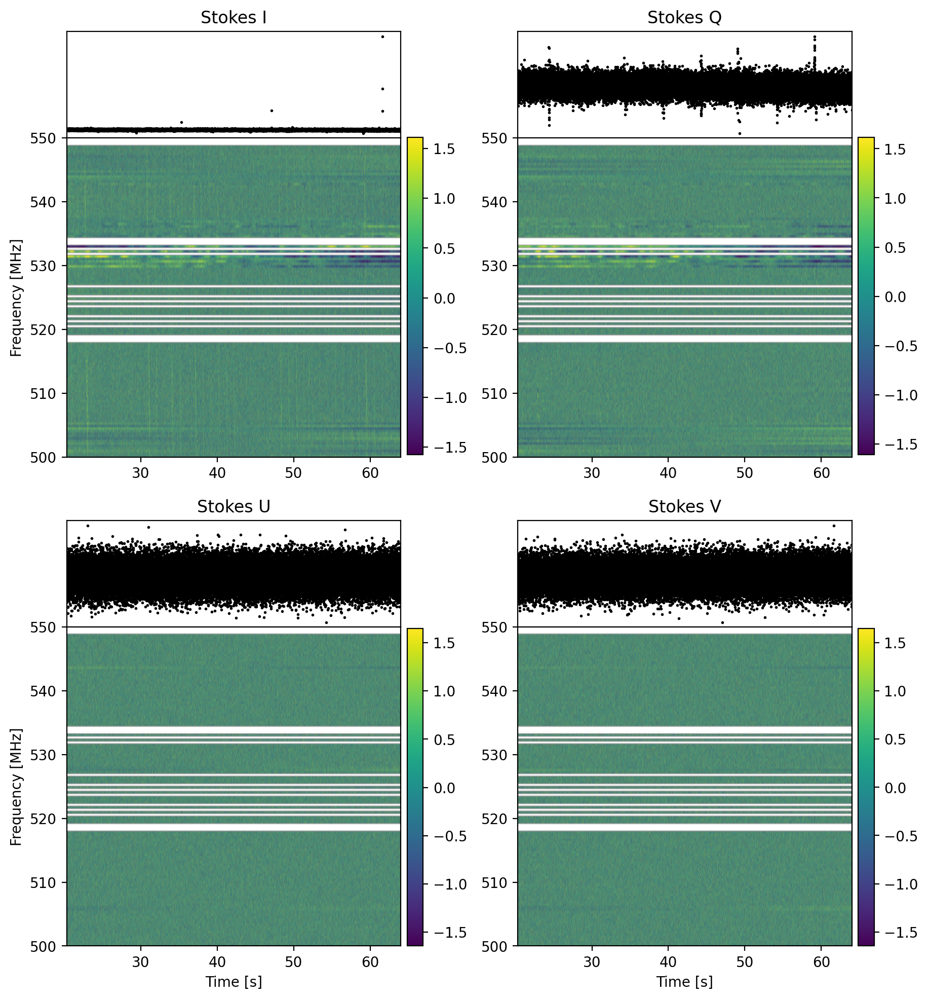

In [43]:
# Plot normalized & masked data
stokes_norm_list = [data_norm_dict[s] for s in S_LABELS]
stokes_masked_list = [data_norm_masked_dict[s] for s in S_LABELS]

plot_stokes(stokes_masked_list, freq=freq.value, time=t_global, t_unit='s', cbar_lim=stokes_norm_list)

# RM Synthesis

In [23]:
def get_spectra(Q, U, t_range=[0,None], freq=freq, f_range=[0,None], normalize=True, replace_nans=True):
    """
    Calculate (normalized) Q and U spectra.

    Returns normalized Q and U spectra averaged over the specified time range.

    Parameters
    ----------
    Q : Stokes Q array (shape: [Nfreqs, Ntimes]).
    U : Stokes U array (shape: [Nfreqs, Ntimes]).
    t_range : Time range to average over (in indices) [start, stop].
    freq : Frequency array (in MHz), matches Nfreqs.
    f_range : Frequency range to get the spectrum for (in indices) [start, stop].
    normalize : If True, normalize the spectra by L.
    replace_nans : If True, replace NaNs with 0 in the normalized spectra.
    """
    
    # Time average
    f_start, f_stop = f_range
    freq = freq[f_start:f_stop]
    t_start, t_stop = t_range
    Q_spec = np.mean((Q)[f_start:f_stop,t_start:t_stop], axis=1)
    U_spec = np.mean((U)[f_start:f_stop,t_start:t_stop], axis=1)

    # Normalize
    if normalize:
        L_spec = np.sqrt(Q_spec**2 + U_spec**2)
        Q_spec_norm = Q_spec / L_spec
        U_spec_norm = U_spec / L_spec
    else:
        Q_spec_norm = Q_spec
        U_spec_norm = U_spec

    # Handle NaNs
    if replace_nans:
        Q_spec_norm = np.nan_to_num(Q_spec_norm, nan=0.0)
        U_spec_norm = np.nan_to_num(U_spec_norm, nan=0.0)

    return Q_spec_norm, U_spec_norm




def rm_synthesis(P_spec, lambda_sq, dlambda_squared, phi_array, #phi_min=0, phi_max=1e5,
                  title='', plot=True):
    """
    Perform RM synthesis on the given P spectrum.
    
    Parameters
    ----------
    P_spec : Normalized complex P spectrum (shape: [Nfreqs,]).
    lambda_sq : Squared wavelength array (shape: [Nfreqs,]). In m^2.
    dlambda_squared : Spacing between lambda^2 values. In m^2.
    phi_array : Array of phi values to compute the FDF for (shape: [N_phi,]). In rad.
    title : Title for the plot.
    plot : If True, plot the resulting FDF.

    Returns
    -------
    RM_meas : Phi value at which the peak of the FDF occurs (in rad/m^2).
    FDF : F(phi) for the given P_spec (shape: [N_phi,]).
    """

    # Compute integral for each phi value
    N_phi = len(phi_array)
    FDF = np.zeros(N_phi, dtype=complex)
    for i, phi in enumerate(phi_array):
        integrand = P_spec * np.exp(-2j * phi * lambda_sq)  
        FDF[i] = np.sum(integrand) * dlambda_squared

    # Plot
    if plot:
        plt.plot(phi_array, np.abs(FDF), lw=1)
        plt.title(title)
        # plt.xlim(1e2, 1e5)
        plt.show()

    # Find peak phi (= RM)
    FDF_peak_ind = np.argmax(np.abs(FDF))
    RM_meas = phi_array[FDF_peak_ind]
    # print(f"The measured RM is {RM_meas} rad/m^2")

    return RM_meas, FDF

In [28]:
# Get lambda^2 array
lambda_sq = (c.value/(freq*1e6))**2  # shape (Nfreqs)
# Get lambda^2 spacing
dlambda_squared = np.abs(lambda_sq[1] - lambda_sq[0])

# Get phi range for RM synthesis
phi_min = -300
phi_max = 300
# phi_max = np.sqrt(3)/dlambda_squared  # RM_max = sqrt(3)/dlambda^2
N_phi = 1000  # Number of phi values to sample
phi_array = np.linspace(phi_min, phi_max, N_phi)

In [29]:
# Time slice parameters
step = 10  # size of time chunk (# of time channels)
time_slice_arr = t_global[::step]  # New time array (using start times of each time slice)

# Set up arrays for results
RM_meas_arr = np.zeros(len(time_slice_arr))  # Store peak of FDF for each time slice
FDF_arr = np.zeros((len(time_slice_arr), N_phi), dtype=complex)  # FDF for each time slice

# Step through time & compute FDF
for i,start in enumerate(time_slice_arr):
  # Time slice info
  t_start = np.argwhere(t_global==start)[0][0]
  t_stop = t_start+step

  # Get the spectra (avg over time slice) * .T to have arrays as [Nfreqs, Ntimes]
  Q_spec_norm, U_spec_norm = get_spectra(data_norm_masked_dict['Q'].T, data_norm_masked_dict['U'].T, t_range=[t_start, t_stop])
  P_spec_norm = Q_spec_norm + 1j*U_spec_norm

  # Compute FDF and RM for the time slice
  RM_meas_arr[i], FDF_arr[i] = rm_synthesis(P_spec_norm,
                                            lambda_sq=lambda_sq,
                                            dlambda_squared=dlambda_squared, 
                                            phi_array=phi_array,
                                            title=f"{t_start:.2f} - {t_stop:.2f} {'ms'}",
                                            plot=False
                                          )

# Plot Results

In [30]:
def plot_2panels(data, time, phi, cbar_label='', plot_true=False, height_ratios=[1, 3],
                 ax1_type='peak', ax2_ylabel=r'RM [rad/m$^2$]', t_unit='ms', xlim=None):
    """
    Make a 2-panel phi/time plot of some data.

    Parameters
    ----------
    data : Data to plot (shape: [Ntimes, Nphi]). Absolute value is taken.
    time : Time array (shape: [Ntimes]).
    phi : Phi array (shape: [Nphi]).
    cbar_label : Colorbar label.
    plot_true : If True, plot the true burst times as vertical dashed lines.
    height_ratios : Ratios of the heights of the two panels.
    ax1_type : Type of the first panel ('peak' for peak amplitude, 'mean' for mean amplitude).
    t_unit : Unit for the time axis (e.g., 'ms', 's').
    """
    
    fig, (ax1, ax2) = plt.subplots(
        2, 1, 
        gridspec_kw={'height_ratios':height_ratios, 'right':0.85, 'hspace':0}, 
        sharex=True,
        figsize=(8, 8),
        dpi=150
    )

    # AX1: True bursts
    if plot_true:
        ax1.axvline(TIME_TRUE[0], color='grey', linestyle='--', label='True bursts')
        ax1.axvline(TIME_TRUE[1], color='grey', linestyle='--')
        ax1.legend(loc='upper left')

    # AX1: Get peak or avg for each time slice
    peak = np.max(np.abs(data), axis=1) if ax1_type=='peak' else np.mean(np.abs(data), axis=1)
    ax1.plot(time, peak, lw=0.8, c='rebeccapurple')
    ax1_label = 'Peak Amp.' if ax1_type == 'peak' else 'Avg. Amp.'
    ax1.set_ylabel(ax1_label)


    # AX2: Plot data
    extent = (time[0], time[-1], phi[0], phi[-1])
    im = ax2.imshow(np.abs(data).T,  # shape (Ntimes, Nphi).T
                    aspect='auto',
                    origin='lower',
                    extent=extent,
                    cmap='viridis'
                    )
    ax2.set_xlabel(f'Time [{t_unit}]')
    ax2.set_ylabel(ax2_ylabel)
    
	# Colorbar
    cbar = fig.colorbar(im, ax=(ax1, ax2), pad=0.02, 
                        shrink=height_ratios[1]/np.sum(height_ratios), 
                        anchor=(0.0, 0.0)
                        )
    cbar.set_label(cbar_label)

    # Axis limits
    if xlim is not None:
        ax1.set_xlim(xlim[0], xlim[1])
        ax2.set_xlim(xlim[0], xlim[1])
    
    # plt.tight_layout()
    plt.show()

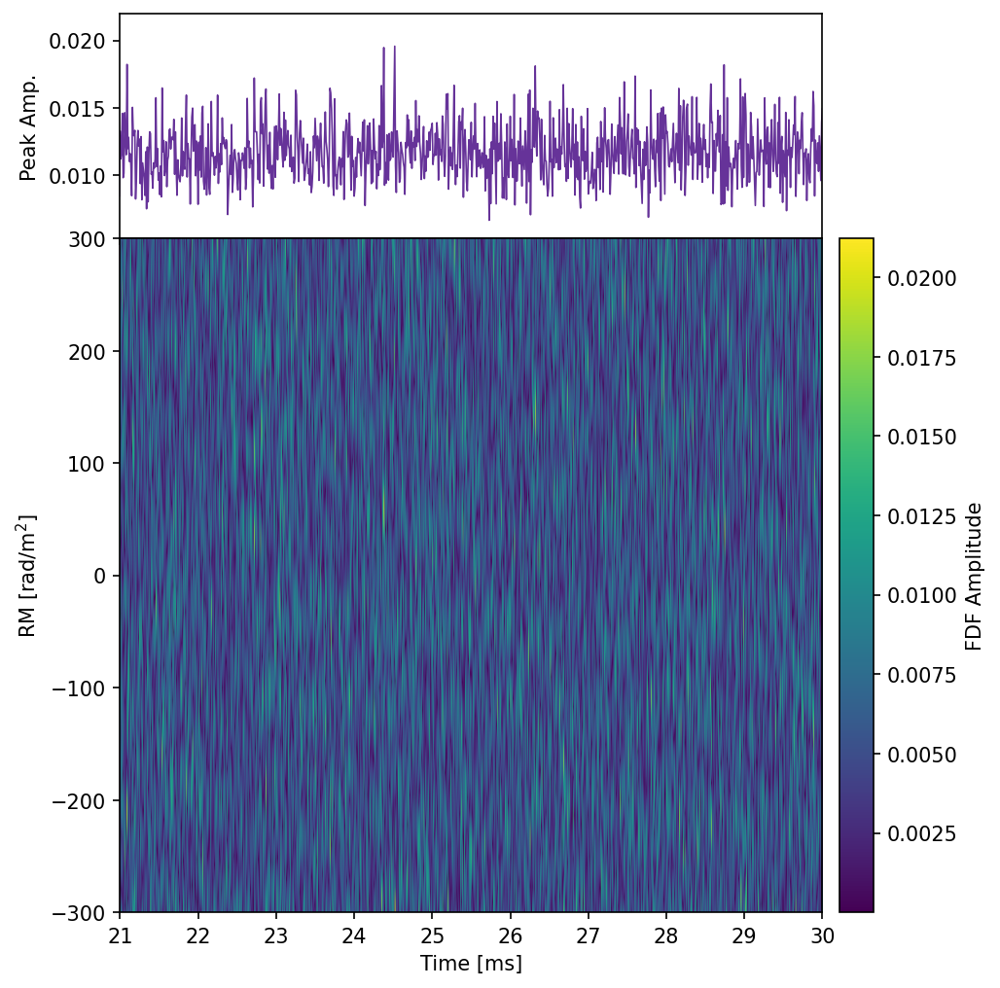

In [31]:
plot_2panels(FDF_arr, time_slice_arr, phi_array, cbar_label='FDF Amplitude', xlim=[21,30])

# Testing